# **AI-Driven Algorithms for Brain Tumour Detection and Classification**

In [1]:
# libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,roc_auc_score,confusion_matrix,roc_curve,auc
from sklearn import preprocessing
from warnings import filterwarnings
import os
import cv2

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Import and Shuffle the dataset

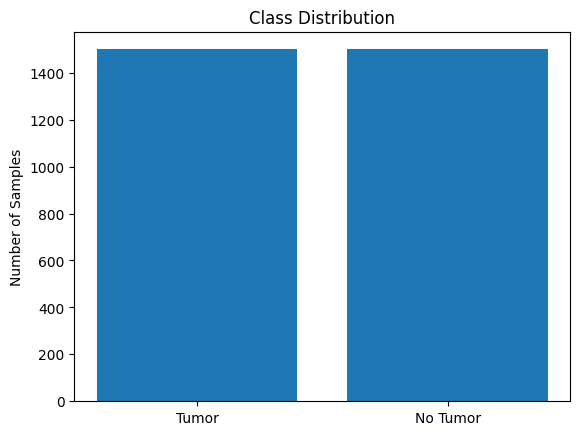

In [2]:
path = os.listdir('Downloads/Brain Tumor Detection')
classes = {'no':0, 'yes':1}

import random

# data set
data_x = []
data_y = []

# We will use this dataset for visualizing in test prediction
test_x = []
test_y = []

data = []

for cls in classes:
    pth = 'Downloads/Brain Tumor Detection' + cls
    for j in os.listdir(pth):
        img = cv2.imread(pth + '/' + j, 0)
        img = cv2.resize(img, (200, 200))
        data.append((img, classes[cls]))
    
# Shuffle the data for the current class
random.shuffle(data)

# Define the class names
class_names = ['Tumor', 'No Tumor']

# Count the number of samples in each class
class_counts = {}
for _, cls in data:
    if cls in class_counts:
        class_counts[cls] += 1
    else:
        class_counts[cls] = 1

# Plot the bar chart
plt.bar(class_names, class_counts.values())
plt.ylabel('Number of Samples')
plt.title('Class Distribution')
plt.show()

In [3]:
# Split the data into train and test sets
images, labels = zip(*data)
data_images, test_images, data_labels, test_labels = train_test_split(images, labels, test_size=0.01, random_state=42)

# Append the shuffled data,test to the main lists
data_x.extend(data_images)
data_y.extend(data_labels)

test_x.extend(test_images)
test_y.extend(test_labels)
print(test_y)
    

print('Data set size : ',len(data_x))
print('Test set size : ',len(test_x))

[1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0]
Data set size :  2970
Test set size :  30


# Prepare data

In [4]:
data_x = np.array(data_x)
data_y = np.array(data_y)

data_x_updated = data_x.reshape(len(data_x), -1)
data_x_updated.shape

xtrain, xtest, ytrain, ytest = train_test_split(data_x_updated, data_y, random_state=10,
                                               test_size=.20)
xtrain.shape, xtest.shape

((2376, 40000), (594, 40000))

## Feature Scaling

In [5]:
# AS we can see, x_train & x_test are not scale
print(xtrain)
print(xtrain.max(), xtrain.min())
print(xtest.max(), xtest.min())

# Scaling the dataset
scaler = preprocessing.MinMaxScaler()
xtrain = scaler.fit_transform(xtrain)
xtest = scaler.fit_transform(xtest)

print(xtrain.max(), xtrain.min())
print(xtest.max(), xtest.min())
print(xtrain)

[[2 2 2 ... 1 1 1]
 [0 0 0 ... 0 0 0]
 [3 3 3 ... 3 3 3]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [3 3 3 ... 0 0 0]]
255 0
255 0
1.0 0.0
1.0000000000000002 0.0
[[0.00784314 0.00784314 0.00784314 ... 0.00392157 0.00392157 0.00392157]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.01176471 0.01176471 0.01176471 ... 0.01176471 0.01176471 0.01176471]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.01176471 0.01176471 0.01176471 ... 0.         0.         0.        ]]


# **SVC Model**

## Training and getting report

In [10]:
from sklearn.svm import SVC

# Training the dataset
sv = SVC()
sv.fit(xtrain, ytrain)

# Evaluation
print("Training Score:", sv.score(xtrain, ytrain))
print("Testing Score:", sv.score(xtest, ytest))

# Prediction
pred = sv.predict(xtest)

Training Score: 0.984006734006734
Testing Score: 0.9562289562289562


## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.95      0.95      0.95       279
           1       0.96      0.96      0.96       315

    accuracy                           0.96       594
   macro avg       0.96      0.96      0.96       594
weighted avg       0.96      0.96      0.96       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




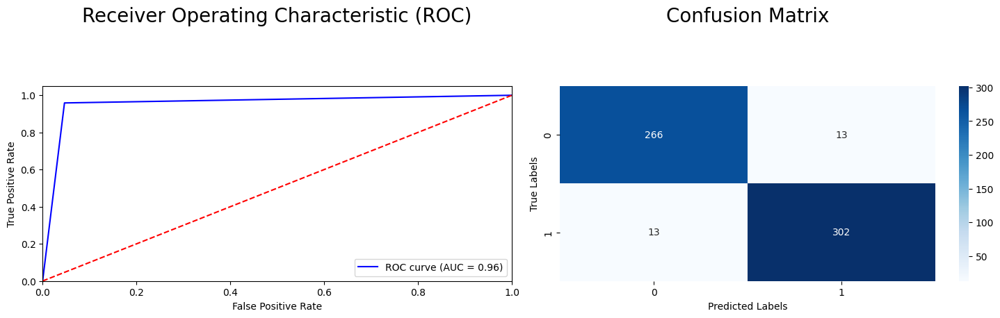

In [11]:
plot_metrics(ytest,pred)

## Visualize the proccess

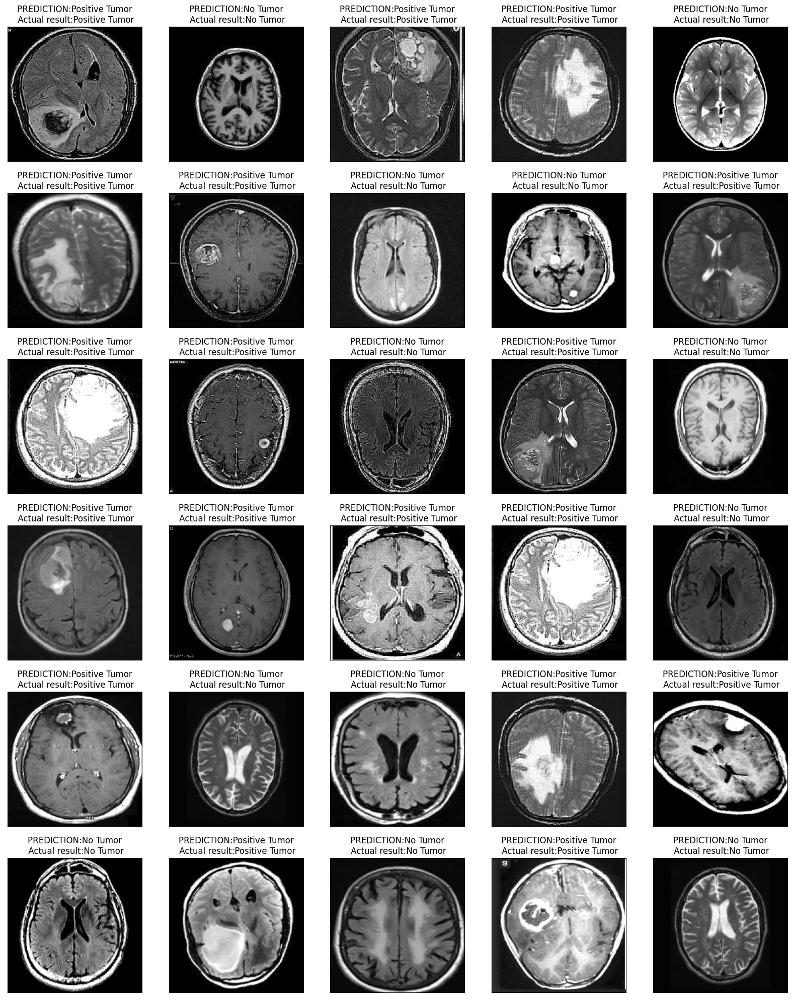

In [12]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):   
       img1 = test_x[i].reshape(1,-1)/255
       p = sv.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")


# **KNN Model**

## Training

In [13]:
from sklearn.neighbors import KNeighborsClassifier

# train the dataset
knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(xtrain, ytrain)

# Prediction
pred = knn_model.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.85      0.99      0.92       279
           1       0.99      0.85      0.92       315

    accuracy                           0.92       594
   macro avg       0.92      0.92      0.92       594
weighted avg       0.93      0.92      0.92       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




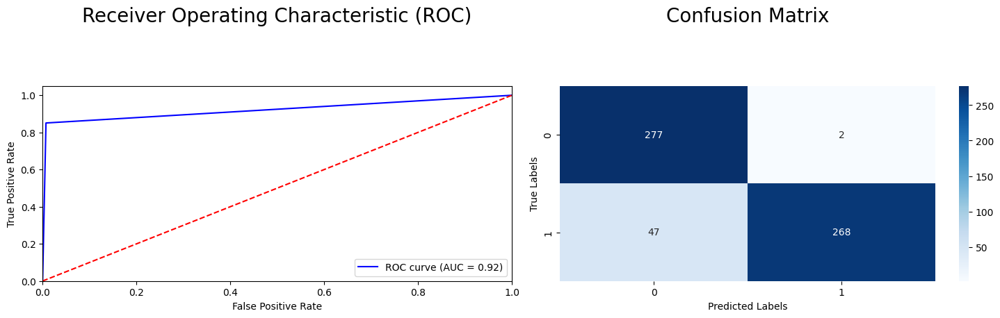

In [14]:
plot_metrics(ytest, pred)

## Visualize the proccess

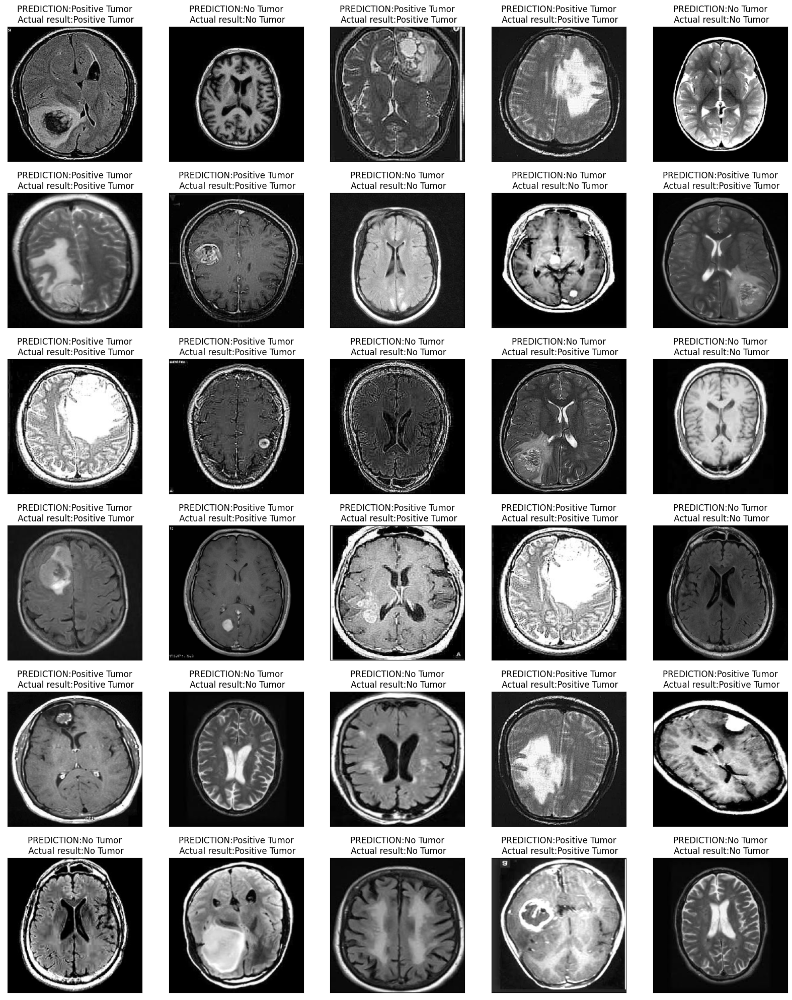

In [15]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img1 = test_x[i].reshape(1,-1)/255
       p = knn_model.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")

# **Convolutional Neural Networks**

## Train function

In [20]:
import tensorflow as tf

def train_model(X_train, y_train, num_nodes, dropout_prob, lr, batch_size, epochs):
  nn_model = tf.keras.Sequential([
      tf.keras.layers.Dense(num_nodes, activation='relu', input_shape=(None,40000)),
      tf.keras.layers.Dropout(dropout_prob),
      tf.keras.layers.Dense(num_nodes, activation='relu'),
      tf.keras.layers.Dropout(dropout_prob),
      tf.keras.layers.Dense(1, activation='sigmoid')
  ])

  nn_model.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='binary_crossentropy',
                  metrics=['accuracy'])
  history = nn_model.fit(
    X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0
  )

  return nn_model, history

## Finding best combination for least value loss by training

32 nodes, dropout 0, lr 0.01, batch size 32


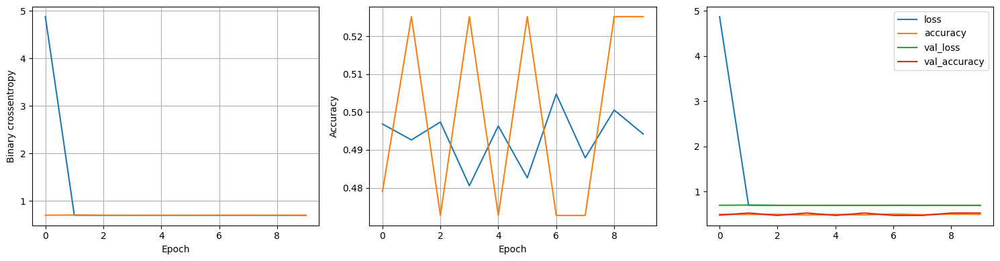

LOSS:  0.6949
ACCURACY:  0.47
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.01, batch size 128


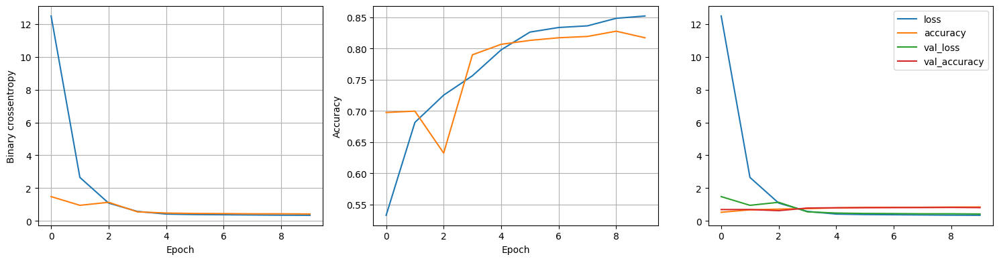

LOSS:  0.4345
ACCURACY:  0.83
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.001, batch size 32


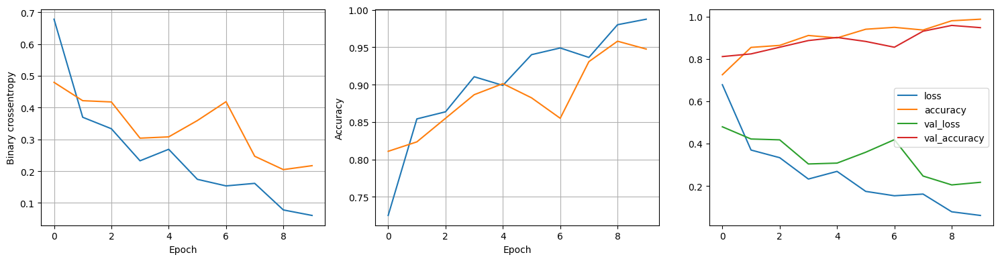

LOSS:  0.2135
ACCURACY:  0.95
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.001, batch size 128


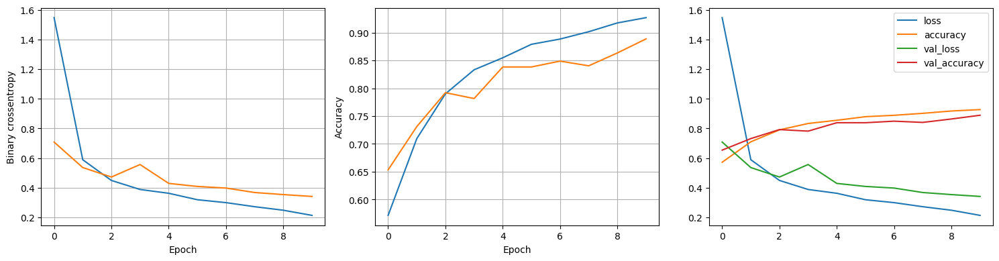

LOSS:  0.3673
ACCURACY:  0.87
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.01, batch size 32


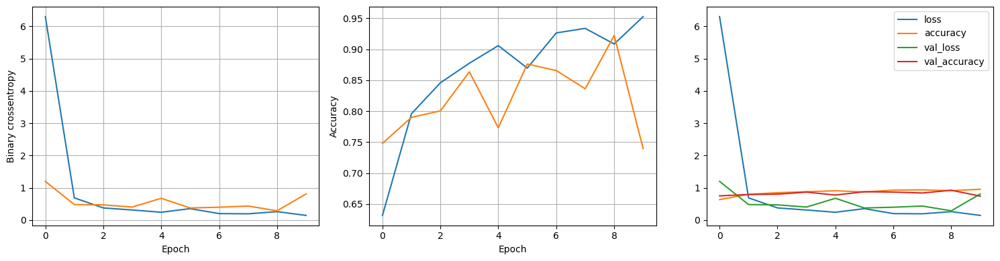

LOSS:  0.7115
ACCURACY:  0.76
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.01, batch size 128


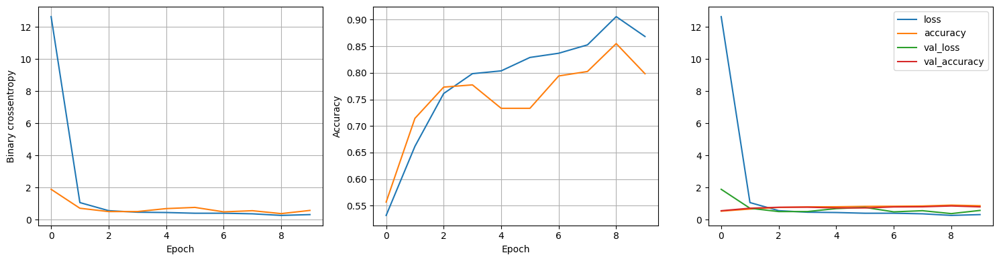

LOSS:  0.5084
ACCURACY:  0.82
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.001, batch size 32


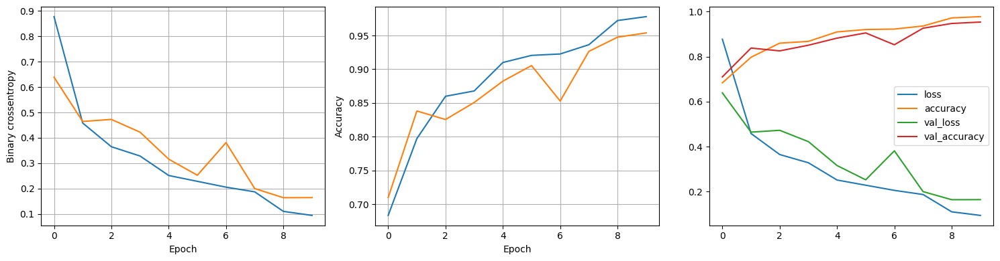

LOSS:  0.1779
ACCURACY:  0.94
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.001, batch size 128


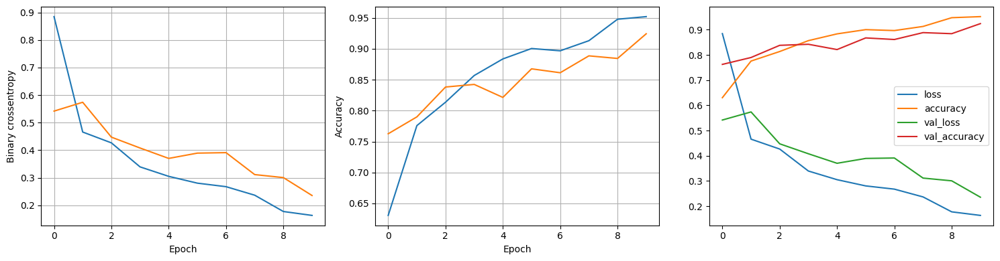

LOSS:  0.2313
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 





In [21]:
least_val_loss = float('inf')
least_loss_model = None
epochs=10
dropout_prob = 0
for num_nodes in [32, 64]:
    for lr in [0.01, 0.001]:
      for batch_size in [32, 128]:
        print(f"{num_nodes} nodes, dropout {dropout_prob}, lr {lr}, batch size {batch_size}")
        model, history = train_model(xtrain, ytrain, num_nodes, dropout_prob, lr, batch_size, epochs)
        plot_history(history)
       
        results = model.evaluate(xtest, ytest,verbose=0)
        print("LOSS:  " + "%.4f" % results[0])
        print("ACCURACY:  " + "%.2f" % results[1])
        val_loss = results[0]
        print("_"*230,'\n\n\n')
        if val_loss < least_val_loss:
          least_val_loss = val_loss
          least_loss_model = model

In [22]:
Model_Results = least_loss_model.evaluate(xtest,ytest)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

19/19 [==============================] - 0s 6ms/step - loss: 0.1779 - accuracy: 0.9428
LOSS:  0.1779
ACCURACY:  0.94


## Confusion matrix , Classification Report , ROC Curves

19/19 [==============================] - 0s 5ms/step

               precision    recall  f1-score   support

           0       0.96      0.91      0.94       279
           1       0.93      0.97      0.95       315

    accuracy                           0.94       594
   macro avg       0.94      0.94      0.94       594
weighted avg       0.94      0.94      0.94       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




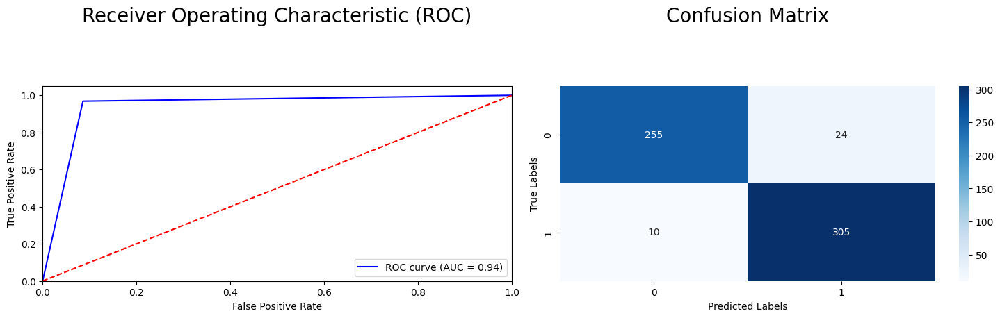

In [23]:
y_pred = least_loss_model.predict(xtest)
y_pred = (y_pred > 0.5).astype(int).reshape(-1,)
plot_metrics(ytest, y_pred)

## Visualize the proccess

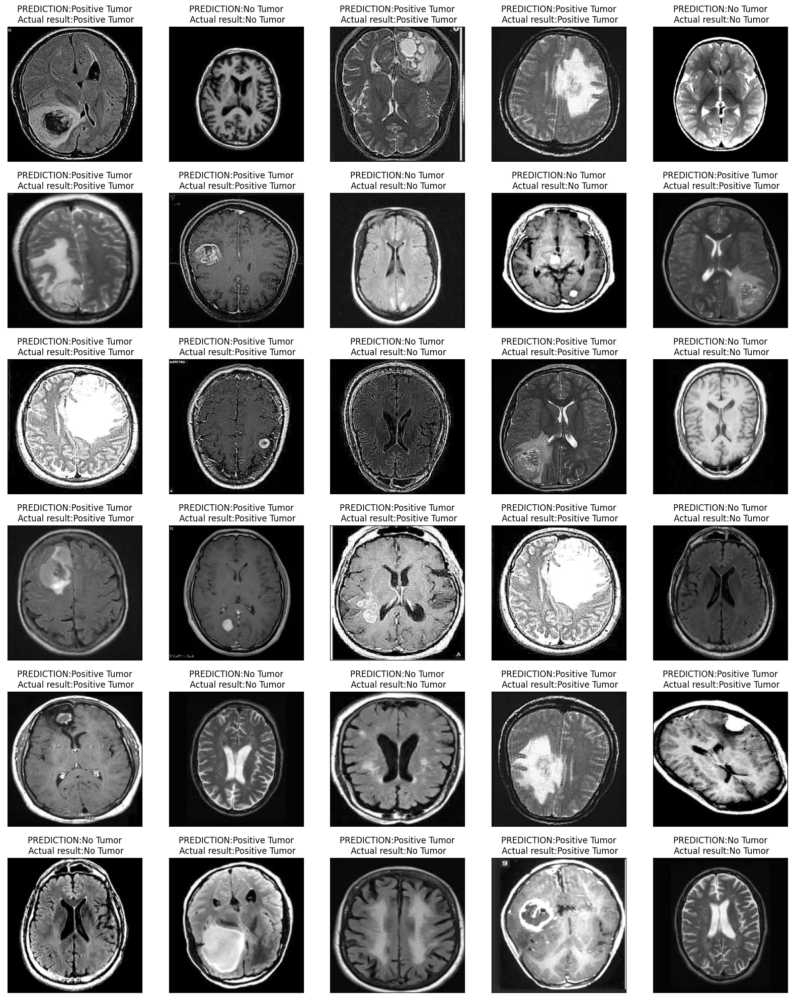

In [24]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img = test_x[i].reshape(1,-1)/255
       p = (least_loss_model.predict(img,verbose = 0)> 0.5).astype(int)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0][0]]}\n Actual result:{dec[test_y[i]]}")

# **Random Forest**

## Training

In [25]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(xtrain, ytrain)

y_pred = rf.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.96      0.96      0.96       279
           1       0.97      0.97      0.97       315

    accuracy                           0.96       594
   macro avg       0.96      0.96      0.96       594
weighted avg       0.96      0.96      0.96       594
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




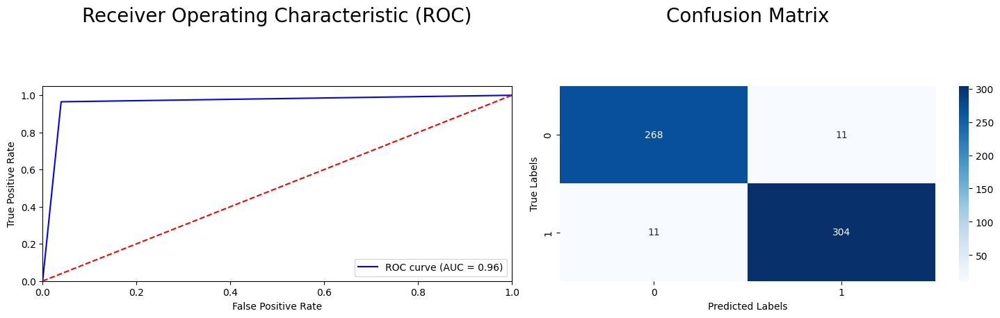

In [26]:
plot_metrics(ytest,y_pred)

## Visualize the proccess

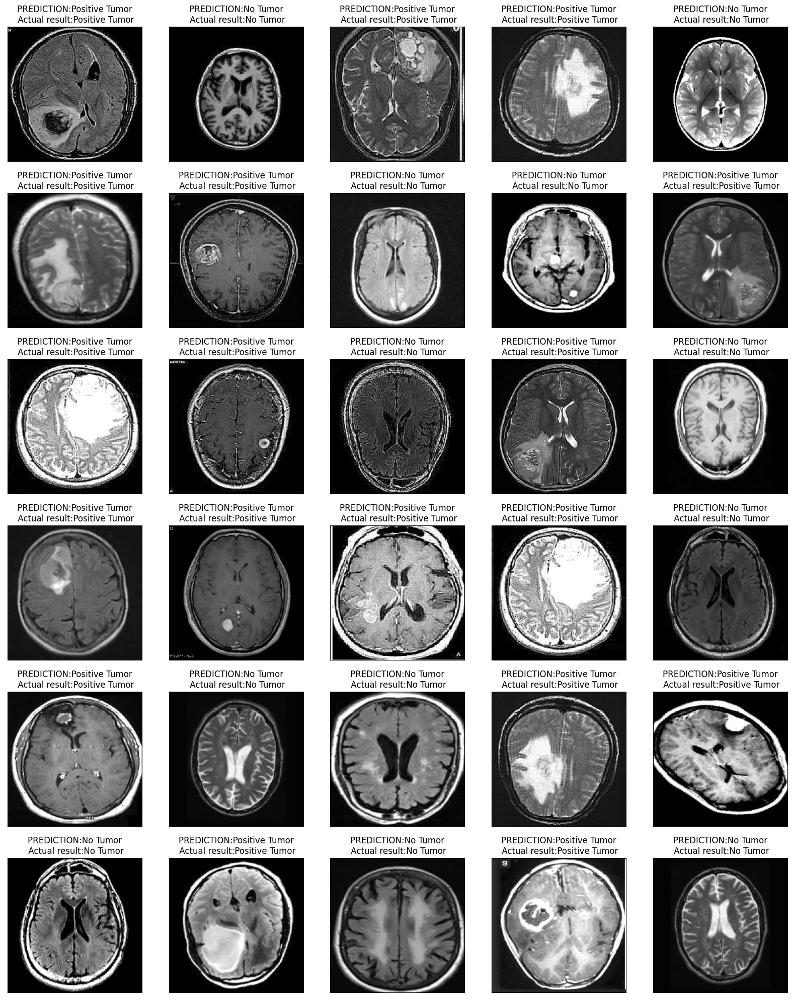

In [27]:
dec = {0:'No Tumor', 1:'Positive Tumor'}

fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img1 = test_x[i].reshape(1,-1)/255
       p = rf.predict(img1)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{dec[p[0]]}\n Actual result:{dec[test_y[i]]}")
